# 1. Imports

In [ ]:

from ipywidgets import widgets, interact, interactive, Layout
import pickle
import numpy as np
from sklearn import decomposition
from plotly import express as px
from matplotlib import pyplot as plt

from PIL import Image
import os
import requests
import json
from PIL import Image
import numpy as np
from scipy import ndimage
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 2. I2_inch MoS2_MOCVD1 Samples

In [ ]:
list_url = 'https://m4-2dcc.vmhost.psu.edu/list'
api_url = list_url + '/api/v2/'

with open('credentials_readonly.json', 'r') as fid:
    credentials = json.load(fid)

with open('credentials_readonly.json', 'r') as fid:
    credentials = json.load(fid)

query = {'projectId': 'I2_inch MoS2_MOCVD1',  'technique': 'Metal-organic CVD', 'withCharacterization': 'AFM', "includeFinalized": True, "includeSplitPieces": True}#, 'withCharacterization': 'AFM','technique': 'MOCVD'}
response = requests.post(api_url+'samples/search', json=query, headers=credentials)
all_samples = response.json()['data']
print(f'retrieved {len(all_samples)} MoS2_MOCVD1 from LiST')

keys = ['projectId','id', 'sampleLabel', 'creationDate', 'materials', 'techniqueId', 'userId', 'instrumentId']
data = response.json()['data']
df1 = pd.DataFrame({k: [x[k] for x in data] for k in keys})
df1

retrieved 355 MoS2_MOCVD1 from LiST


,projectId,id,sampleLabel,creationDate,materials,techniqueId,userId,instrumentId
0,131,6097,MCV1-190423A-TC,2019-04-23T00:00:00,[MoS2],MOCVD,tuc21,MCV1
1,131,509,MCV1-200103A-TC,2020-01-03T00:00:00,[MoS2],MOCVD,tuc21,MCV1
2,131,10232,MCV1-200113A-NT,2020-01-13T00:00:00,[MoS2],MOCVD,njt5294,MCV1
3,131,7785,MCV1-210122A-HZ,2021-01-22T00:00:00,[MoS2],MOCVD,hzz111,MCV1
4,131,7786,MCV1-210122B-HZ,2021-01-22T00:00:00,[MoS2],MOCVD,hzz111,MCV1
...,...,...,...,...,...,...,...,...
350,131,16225,MCV1-230202B-NT,2023-02-02T00:00:00,[MoS2],MOCVD,njt5294,MCV1
351,131,16388,MCV1-230210A-CC,2023-02-10T00:00:00,[MoS2],MOCVD,cuc33,MCV1
352,131,16389,MCV1-230210B-CC,2023-02-10T00:00:00,[MoS2],MOCVD,cuc33,MCV1
353,131,16396,MCV1-230214A-NT,2023-02-14T00:00:00,[MoS2],MOCVD,njt5294,MCV1


In [ ]:
import tqdm
df2 = pd.DataFrame({k: [x[k] for x in data] for k in keys})


substrates2 = {}

pbar = tqdm.tqdm(df2['sampleLabel'])

for sample_id in pbar:
  response = requests.get(api_url+f'samples/{sample_id}', headers=credentials)
  sample_data = response.json()
  if 'substrate' not in sample_data.keys():
    substrates2[sample_id] = 'None'
    continue
  this_sub = sample_data['substrate']
  sub_str = []
  for key in ['name', 'orientation']:
    if key in this_sub:
      sub_str.append(this_sub[key])
      substrates2[sample_id] = ' '.join(sub_str)

df2['substrate'] = [substrates2[it] for it in df2['sampleLabel']]
df2

100%|██████████| 355/355 [03:38<00:00,  1.62it/s]


,projectId,id,sampleLabel,creationDate,materials,techniqueId,userId,instrumentId,substrate
0,131,6097,MCV1-190423A-TC,2019-04-23T00:00:00,[MoS2],MOCVD,tuc21,MCV1,c-Sapphire
1,131,509,MCV1-200103A-TC,2020-01-03T00:00:00,[MoS2],MOCVD,tuc21,MCV1,c-Sapphire
2,131,10232,MCV1-200113A-NT,2020-01-13T00:00:00,[MoS2],MOCVD,njt5294,MCV1,c-Sapphire
3,131,7785,MCV1-210122A-HZ,2021-01-22T00:00:00,[MoS2],MOCVD,hzz111,MCV1,c-Sapphire
4,131,7786,MCV1-210122B-HZ,2021-01-22T00:00:00,[MoS2],MOCVD,hzz111,MCV1,c-Sapphire
...,...,...,...,...,...,...,...,...,...
350,131,16225,MCV1-230202B-NT,2023-02-02T00:00:00,[MoS2],MOCVD,njt5294,MCV1,Al2O3
351,131,16388,MCV1-230210A-CC,2023-02-10T00:00:00,[MoS2],MOCVD,cuc33,MCV1,Al2O3 c-plane
352,131,16389,MCV1-230210B-CC,2023-02-10T00:00:00,[MoS2],MOCVD,cuc33,MCV1,Al2O3 c-plane
353,131,16396,MCV1-230214A-NT,2023-02-14T00:00:00,[MoS2],MOCVD,njt5294,MCV1,Al2O3 c-plane


In [ ]:
unique_substrate_dic = {}
unique_substrate_lis = []
for index, item in enumerate(df2['substrate']):
  if item not in unique_substrate_lis:
    unique_substrate_lis.append(item)
print(unique_substrate_lis)

for index, item in enumerate(unique_substrate_lis):
  my_count = 0
  for item2 in df2['substrate']:
    if item == item2:
      my_count += 1
  unique_substrate_dic[item] = my_count

print(unique_substrate_dic)


['c-Sapphire', 'AlN ', 'Al2O3', 'Scored c-Al2O3', 'Al2O3 c-sapphire', 'Al2O3 c-plane', 'Al2O3 M-plane', 'Al2O3 A-plane', 'Al2O3 on Al2O3', 'C-Al2O3 c-plane', 'Al2O3 c-plane to A']
{'c-Sapphire': 163, 'AlN ': 4, 'Al2O3': 4, 'Scored c-Al2O3': 2, 'Al2O3 c-sapphire': 1, 'Al2O3 c-plane': 135, 'Al2O3 M-plane': 10, 'Al2O3 A-plane': 10, 'Al2O3 on Al2O3': 8, 'C-Al2O3 c-plane': 17, 'Al2O3 c-plane to A': 1}


In [ ]:
#record_of_sampleId = [7318, 7319, 7320, 7321, 7322, 7323, 7325, 7326, 7327, 7328, 7329, 7330, 7331, 7332, 7333, 7334, 7335, 7338, 7339, 7340, 7341, 7342, 7343, 7344, 7345, 7346, 7347, 7201, 7349, 7350, 7351, 7354, 7355, 9777, 9778, 9824, 9825, 9826, 9827, 9828, 9829, 9830, 9831, 9832, 9833, 9834, 9835, 8082, 9837, 9838, 9839, 9840, 9760, 9761, 9763, 9764, 9765, 9766, 9767, 9768, 9769, 9770, 9784, 9785, 9786, 9787, 9788, 9789, 9791, 9919, 9920, 9921, 9922, 9923, 9924, 9925, 9926, 9927, 9928, 9929, 9930, 9931, 9932, 9933, 9934, 9935, 9936, 9937, 9938, 9939, 9940, 9941, 9942, 9944, 9945, 9946, 9947, 10279, 12551, 12552, 12553, 12133, 13269, 15750, 13338, 13339, 14809, 14811, 14812, 14826, 14828, 15741, 15742, 14829, 13591, 13340, 13592, 13341, 13342, 13351, 13378, 15743, 15744, 15745, 15746, 15747, 15748, 15903, 16696]
id_afm = []
for it in all_samples:
  #print(it)
  id_afm.append(it['id'])

print(id_afm)
print(len(id_afm))
activities_afm = []
id_afm_activities = []
#for id in record_of_sampleId:
#id_afm = ['MCV1-190423A-TC']
for id in id_afm:
  response = requests.get(api_url+f'samples/{id}/activities', headers=credentials)
  #print(type(response.json()))
  try:
    activities = response.json()
    activities_afm.append(activities)
    id_afm_activities.append(id)

  except:

    continue

print(f'len of activities is', len(activities_afm))
print(f'len of id_afm_activities is', len(id_afm_activities))


[6097, 509, 10232, 7785, 7786, 7787, 7790, 7791, 7792, 7794, 7838, 7839, 7807, 7808, 7809, 7840, 7841, 7842, 7844, 8008, 8005, 8555, 8612, 11721, 8614, 8615, 8617, 8679, 8620, 8621, 8623, 8624, 8625, 8626, 9859, 9860, 9862, 9863, 9864, 9865, 9866, 9868, 9869, 9870, 9871, 9872, 9873, 9874, 9875, 9856, 10181, 10193, 10192, 10189, 10190, 10191, 10162, 10213, 10214, 10215, 10216, 10239, 10305, 10306, 10307, 10308, 10310, 10311, 10313, 10316, 10318, 10319, 10354, 10358, 10359, 10360, 10361, 10368, 10375, 10389, 10393, 10394, 11664, 10399, 10400, 10407, 10782, 10783, 10785, 10786, 10788, 10789, 10798, 10845, 10846, 10847, 10852, 10853, 10854, 11662, 10898, 10902, 10905, 10906, 11661, 10968, 10980, 10981, 11016, 11017, 11018, 11019, 11020, 11047, 11048, 11083, 11155, 11157, 11158, 11163, 11164, 11165, 11266, 11277, 11280, 11281, 11292, 11293, 11297, 11299, 11306, 11614, 11615, 11659, 11637, 11705, 11733, 11887, 11888, 11890, 12149, 12150, 12619, 12621, 12622, 12629, 12878, 12879, 12880, 12883

# 3. Retrieving Samples with spm Files (Center, 1um)

In [ ]:
def check_image(imgfilename):
  centre_indicator = ['-c-', '-C-', '- c -', '- C -', 'enter', 'entre']
  size_indicator = ['1um', '1UM', '1 um', '1 UM']
  #sensor_indicator = ['_1', 'Height', 'height']
  check_centre = any(strg in filename for strg in centre_indicator)
  check_size = any(strg in filename for strg in size_indicator)
  #check_sensor = any(strg in filename for strg in sensor_indicator)
  image_right = False
  if check_centre and check_size:# and check_sensor:
    image_right=True
  return image_right
tifs = []
tifs_sampleLabel = []

activities_afm_with_tif = []
record_of_sampleLabel = []
for item55 in activities_afm:
  #item55 = activities_afm[tif_files]# in activities_afm:#[:2]:
  tif_sample = 0
  record_of_files = []
  record_of_files.append(item55[0]['sampleId'])
  for item3 in item55:
  #if tif_sample < 1:
    sampleId = item3['sampleId']
    activity_id = item3['id']
    sampleLabel = item3['sample']['sampleLabel']
    files = item3['files']
    if files != []:
      tif_files = 0


      for file1 in files:
      #if tif_files < 1:
        #print(file1)

        for dicts in file1['files']:
          if dicts['filetype'] == 'spm':
            #if 'enter' in dicts['filename'] or 'entre' in dicts['filename']
            filename = dicts['filename']
            if check_image(filename):

              tifs.append(dict(sampleLabel = sampleLabel, sampleId = sampleId, activity_id=activity_id, file_id=dicts['id'], filename=dicts['filename']))
              tifs_sampleLabel.append(sampleLabel)
              activities_afm_with_tif.append(item55)

              record_of_files.append(dicts['id'])
              tif_sample += 1
              tif_files += 1
  #print(f'number of tif_sample: {tif_sample}, number of tif_files: {tif_files}')
  if len(record_of_files)> 1:
    record_of_sampleLabel.append(record_of_files)
    print(f'number of tif_sample: {tif_sample}, number of tif_files: {tif_files}')


print(len(tifs_sampleLabel))
print(len(activities_afm_with_tif))
print(f' len(tifs): {len(tifs)}')

number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 0
number of tif_sample: 1, number of tif_files: 0
number of tif_sample: 2, number of tif_files: 2
number of tif_sample: 3, number of tif_files: 3
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_files: 1
number of tif_sample: 1, number of tif_f

In [ ]:
import json
from IPython.display import HTML

def render(jstr):
  if type(jstr) != str:
    jstr = json.dumps(jstr)
  return HTML("""
<script src="https://rawgit.com/caldwell/renderjson/master/renderjson.js"></script>
<script>
renderjson.set_show_to_level(1)
document.body.appendChild(renderjson(%s))
new ResizeObserver(google.colab.output.resizeIframeToContent).observe(document.body)
</script>
""" % jstr)

render(activities_afm_with_tif)

In [ ]:
import tqdm

pbar = tqdm.tqdm(tifs_sampleLabel)
activities_afm = []
id_afm_activities = []

for id in pbar:
#for id in id_afm:
  response = requests.get(api_url+f'samples/{id}/activities', headers=credentials)
  #print(type(response.json()))
  try:
    activities = response.json()
    activities_afm.append(activities)
    id_afm_activities.append(id)

  except:

    continue

print(f'len of activities is', len(activities_afm))
print(f'len of id_afm_activities is', len(id_afm_activities))


100%|██████████| 368/368 [13:10<00:00,  2.15s/it]

len of activities is 368
len of id_afm_activities is 368


# 4. Retrieving the sampleLabel, sampleId, T, P and Substrates

In [ ]:
df_activities_afm_with_tif = pd.json_normalize(activities_afm)
df_activities_afm_with_tif

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,"{'sampleId': 8620, 'pieces': [], 'technique': ...","{'sampleId': 8620, 'facility': 'MCL', 'charId'...","{'sampleId': 8620, 'facility': 'MCL', 'charId'...",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1,"{'sampleId': 10190, 'pieces': [], 'technique':...","{'sampleId': 10190, 'pieces': [], 'technique':...","{'sampleId': 10190, 'facility': 'MCL', 'charId...",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
2,"{'sampleId': 10191, 'pieces': [], 'technique':...","{'sampleId': 10191, 'pieces': [], 'technique':...","{'sampleId': 10191, 'facility': 'MCL', 'charId...","{'sampleId': 10191, 'facility': '2DCC', 'charI...","{'sampleId': 10191, 'facility': 'MCL', 'charId...",None,None,None,None,None,None,None,None,None,None,None,None,None,None
3,"{'sampleId': 10213, 'pieces': [], 'technique':...","{'sampleId': 10213, 'pieces': [], 'technique':...","{'sampleId': 10213, 'facility': 'MCL', 'charId...","{'sampleId': 10213, 'facility': '2DCC', 'charI...",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
4,"{'sampleId': 10214, 'pieces': [], 'technique':...","{'sampleId': 10214, 'facility': 'MCL', 'charId...","{'sampleId': 10214, 'facility': '2DCC', 'charI...","{'sampleId': 10214, 'facility': 'MCL', 'charId...",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
363,"{'sampleId': 16225, 'pieces': [], 'technique':...","{'sampleId': 16225, 'facility': 'MCL', 'charId...","{'sampleId': 16225, 'facility': '2DCC', 'charI...","{'sampleId': 16225, 'facility': 'Nanofab', 'ch...","{'sampleId': 16225, 'facility': '2DCC', 'charI...",None,None,None,None,None,None,None,None,None,None,None,None,None,None
364,"{'sampleId': 16388, 'pieces': [], 'technique':...","{'sampleId': 16388, 'facility': 'MCL', 'charId...","{'sampleId': 16388, 'facility': '2DCC', 'charI...",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
365,"{'sampleId': 16389, 'pieces': [], 'technique':...","{'sampleId': 16389, 'facility': 'MCL', 'charId...","{'sampleId': 16389, 'facility': '2DCC', 'charI...","{'sampleId': 16389, 'facility': 'MCL', 'charId...",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
366,"{'sampleId': 16396, 'pieces': [], 'technique':...","{'sampleId': 16396, 'facility': 'MCL', 'charId...","{'sampleId': 16396, 'facility': '2DCC', 'charI...",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [ ]:
print(activities_afm[-1][0].keys())
#print(activities_afm[-1][0]['recipe']['groups'])
print(activities_afm[-1][0]['sample'])

dict_keys(['sampleId', 'sample', 'pieces', 'materials', 'id', 'userId', 'visibility', 'category', 'type', 'lastChangedDate', 'lastChangedByUser', 'files', 'status', 'desc'])
{'sampleLabel': 'MCV1-230214B-NT', 'subSamples': [], 'transfered': False, 'finalized': False, 'shipped': False, 'useAsSubstrate': False, 'materialIds': [], 'materials': [], 'notes': [], 'files': [], 'status': 'N'}


In [ ]:
print(activities_afm_with_tif[-1])

[{'sampleId': 16222, 'sample': {'sampleLabel': 'MCV1-230202A-NT', 'subSamples': [], 'transfered': False, 'finalized': False, 'shipped': False, 'useAsSubstrate': False, 'materialIds': [], 'materials': [], 'notes': [], 'files': [], 'status': 'N'}, 'pieces': [], 'technique': 'MOCVD', 'instrument': 'MCV1', 'recipeTemplate': 'MOCVD Recipe Template', 'recipe': {'templateName': 'MOCVD Recipe Template', 'templateHash': '964cb0f70127fe0f571f390ab674699052ddcb63', 'runtimeChangedManualy': False, 'calculatedRuntime': 1.95, 'groups': [{'name': 'Precursors', 'symbol': 'precursors', 'rowType': 'T', 'scrolling': False, 'recipeID': 0, 'allowSeveral': False, 'copyLastRow': False, 'comments': 'off', 'commentTypeEnum': {'id': 'off', 'label': 'Off'}, 'columns': [{'symbol': 'name', 'name': 'Precursor', 'type': 'S', 'precision': 0, 'sourceType': 'C', 'visibility': 'A', 'updateVisibilities': False, 'values': [], 'width': '20px'}, {'symbol': 'used', 'name': 'Used', 'type': 'L', 'defaultValue': 'No', 'precisio

In [ ]:
activities_afm_synthesis = []
for index, lists in enumerate(activities_afm):
#for lists in activities_afm:
  activities_afm_dict = {}
  for item in lists:
    try:
      #if item['recipe']['groups'][0]['name'] == 'Recipe':
      id_orig = ['sampleLabel', 'sampleId', 'technique', 'instrument', 'id', 'runtime']
      for key in id_orig:
        if key == 'sampleLabel':
          activities_afm_dict[key] = item['sample'][key]
        else:
          activities_afm_dict[key] = item[key]

       # for key in item.keys():
          #if key in id_orig:
          #  activities_afm_dict[key] = item[key]
    except:

      continue



  for index, item in enumerate(lists):
    try:
      if item['type'] == 'Synthesis':
        for dict1 in item['recipe']['groups']:
          if dict1['name'] == 'Recipe':
            count_row = 0
            for dict2 in dict1['rows']:# we have 4 rows to 10 rows.
              for list1 in dict2['values']:
                key = f'row{count_row}_{list1[0]}'
                value = list1[1]
                activities_afm_dict[key] = value

              count_row += 1
            activities_afm_synthesis.append(activities_afm_dict)
    except:
      #print(index)
      continue
  #print(len(activities_afm_dict))

print(len(activities_afm_synthesis))


365


In [ ]:
print(activities_afm_synthesis[-1])

{'sampleLabel': 'MCV1-230214B-NT', 'sampleId': 16398, 'technique': 'MOCVD', 'instrument': 'MCV1', 'id': 31974, 'runtime': 2.03, 'row0_step': 'Ramp up T (bub closed)', 'row0_t': 420.0, 'row0_T': 1000.0, 'row0_P': 50.0, 'row0_mf': 1000.0, 'row0_cf': 1000.0, 'row0_bf': 2500.0, 'row0_rf': 75.0, 'row0_h2s_flow': 400.0, 'row0_S_rv': 'N/A', 'row0_h2se_flow': 0.0, 'row0_Se_rv': 'N/A', 'row0_Mo': 15.0, 'row0_Mo_rv': 'Vent', 'row0_W1': 0.0, 'row0_W1_dil': 0.0, 'row0_W1_mix': 0.0, 'row0_W1_rv': 'N/A', 'row0_W2': 0.0, 'row0_W2_rv': 'N/A', 'row0_Te': 0.0, 'row0_Te_dil': 0.0, 'row0_Te_mix': 0.0, 'row0_Te_rv': 'N/A', 'row1_step': 'Ramp up T (bub open)', 'row1_t': 600.0, 'row1_T': 1000.0, 'row1_P': 50.0, 'row1_mf': 1000.0, 'row1_cf': 1000.0, 'row1_bf': 2500.0, 'row1_rf': 75.0, 'row1_h2s_flow': 400.0, 'row1_S_rv': 'N/A', 'row1_h2se_flow': 0.0, 'row1_Se_rv': 'N/A', 'row1_Mo': 15.0, 'row1_Mo_rv': 'Vent', 'row1_W1': 0.0, 'row1_W1_dil': 0.0, 'row1_W1_mix': 0.0, 'row1_W1_rv': 'N/A', 'row1_W2': 0.0, 'row1_W2

In [ ]:
activities_afm_synthesis_correct = activities_afm_synthesis
df_activities_afm_synthesis_correct = pd.json_normalize(activities_afm_synthesis_correct)
df_activities_afm_synthesis_correct

,sampleLabel,sampleId,technique,instrument,id,runtime,row0_step,row0_t,row0_T,row0_P,...,row11_W1,row11_W1_dil,row11_W1_mix,row11_W1_rv,row11_W2,row11_W2_rv,row11_Te,row11_Te_dil,row11_Te_mix,row11_Te_rv
0,MCV1-210504A-NT,8620,MOCVD,MCV1,16569,1.60,Ramp up T,1020,1000,50,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,MCV1-210910A-NT,10190,MOCVD,MCV1,19854,1.80,Ramp up T,1020,900,50,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,MCV1-210917A-NT,10191,MOCVD,MCV1,19855,1.80,Ramp up T,1020,900,50,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,MCV1-210922A-NT,10213,MOCVD,MCV1,20090,1.70,Ramp up T,1020,900,50,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,MCV1-210922B-NT,10214,MOCVD,MCV1,20092,1.70,Ramp up T,1020,900,50,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,MCV1-230202B-NT,16225,MOCVD,MCV1,31312,2.03,Ramp up T (bub closed),960.0,1000.0,50.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
361,MCV1-230210A-CC,16388,MOCVD,MCV1,31573,1.68,Ramp up T (bub closed),420.0,1000.0,50.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
362,MCV1-230210B-CC,16389,MOCVD,MCV1,31973,2.03,Ramp up T (bub closed),420.0,1000.0,50.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
363,MCV1-230214A-NT,16396,MOCVD,MCV1,31590,1.68,Ramp up T (bub closed),420.0,1000.0,50.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
print(df1['substrate'])

0      c-Sapphire
1      c-Sapphire
2      c-Sapphire
3      c-Sapphire
4      c-Sapphire
          ...    
350         Al2O3
351         Al2O3
352         Al2O3
353         Al2O3
354         Al2O3
Name: substrate, Length: 355, dtype: object


In [ ]:
# substrates with orientations
the_substrates2 = []
for index, item in enumerate(df_activities_afm_synthesis_correct['sampleLabel']):
  my_count = 0
  item_dict = {}
  while item_dict == {}:
    if item == df2['sampleLabel'][my_count]:
      item_dict['sampleLabel'] = item
      item_dict['sampleId'] = df_activities_afm_synthesis_correct['sampleId'][index]
      item_dict['substrate2'] = df2['substrate'][my_count]
    else:
      my_count += 1
  the_substrates2.append(item_dict)
print(the_substrates2)
print(len(the_substrates2))

df_the_substrates2 = pd.json_normalize(the_substrates2)
df_the_substrates2

[{'sampleLabel': 'MCV1-210504A-NT', 'sampleId': 8620, 'substrate2': 'c-Sapphire'}, {'sampleLabel': 'MCV1-210910A-NT', 'sampleId': 10190, 'substrate2': 'c-Sapphire'}, {'sampleLabel': 'MCV1-210917A-NT', 'sampleId': 10191, 'substrate2': 'c-Sapphire'}, {'sampleLabel': 'MCV1-210922A-NT', 'sampleId': 10213, 'substrate2': 'c-Sapphire'}, {'sampleLabel': 'MCV1-210922B-NT', 'sampleId': 10214, 'substrate2': 'c-Sapphire'}, {'sampleLabel': 'MCV1-210922B-NT', 'sampleId': 10214, 'substrate2': 'c-Sapphire'}, {'sampleLabel': 'MCV1-210922C-NT', 'sampleId': 10215, 'substrate2': 'c-Sapphire'}, {'sampleLabel': 'MCV1-210922C-NT', 'sampleId': 10215, 'substrate2': 'c-Sapphire'}, {'sampleLabel': 'MCV1-210922C-NT', 'sampleId': 10215, 'substrate2': 'c-Sapphire'}, {'sampleLabel': 'MCV1-210923A-NT', 'sampleId': 10216, 'substrate2': 'c-Sapphire'}, {'sampleLabel': 'MCV1-210923B-NT', 'sampleId': 10239, 'substrate2': 'c-Sapphire'}, {'sampleLabel': 'MCV1-211011A-NT', 'sampleId': 10305, 'substrate2': 'c-Sapphire'}, {'sa

,sampleLabel,sampleId,substrate2
0,MCV1-210504A-NT,8620,c-Sapphire
1,MCV1-210910A-NT,10190,c-Sapphire
2,MCV1-210917A-NT,10191,c-Sapphire
3,MCV1-210922A-NT,10213,c-Sapphire
4,MCV1-210922B-NT,10214,c-Sapphire
...,...,...,...
360,MCV1-230202B-NT,16225,Al2O3
361,MCV1-230210A-CC,16388,Al2O3 c-plane
362,MCV1-230210B-CC,16389,Al2O3 c-plane
363,MCV1-230214A-NT,16396,Al2O3 c-plane


In [ ]:
activities_id_time_T_P = []
for index, item in enumerate(activities_afm_synthesis):
  #print(type(item))
  id_time_T_P = {}
  for row_num in range(11):
    if f'row{row_num}_step' in item.keys():
      #print(f'row{row_num}_step')
      if 'Growth' in item[f'row{row_num}_step']:
        #print('yes')

        #id_time_T_P['sampleId'] = item['sampleId']
        id_time_T_P['time'] = item[f'row{row_num}_t']
        id_time_T_P['T'] = item[f'row{row_num}_T']
        id_time_T_P['P'] = item[f'row{row_num}_P']
  activities_id_time_T_P.append(id_time_T_P)
print(len(activities_id_time_T_P))

365


In [ ]:
df_activities_id_time_T_P_sub = pd.json_normalize(activities_id_time_T_P)
df_activities_id_time_T_P_sub
df_activities_id_time_T_P_sub.insert(0, 'sampleLabel', df_the_substrates1['sampleLabel'], True)
df_activities_id_time_T_P_sub.insert(1, 'sampleId', df_the_substrates1['sampleId'], True)
df_activities_id_time_T_P_sub.insert(5, 'substrate1', df_the_substrates1['substrate1'], True)
df_activities_id_time_T_P_sub.insert(6, 'substrate2', df_the_substrates2['substrate2'], True)
df_activities_id_time_T_P_sub

,sampleLabel,sampleId,time,T,P,substrate1,substrate2
0,MCV1-210504A-NT,8620,180,1000,50,c-Sapphire,c-Sapphire
1,MCV1-210910A-NT,10190,900,900,50,c-Sapphire,c-Sapphire
2,MCV1-210917A-NT,10191,900,900,50,c-Sapphire,c-Sapphire
3,MCV1-210922A-NT,10213,600,900,50,c-Sapphire,c-Sapphire
4,MCV1-210922B-NT,10214,480,900,50,c-Sapphire,c-Sapphire
...,...,...,...,...,...,...,...
360,MCV1-230202B-NT,16225,1200.0,1000.0,50.0,Al2O3,Al2O3
361,MCV1-230210A-CC,16388,540.0,1000.0,50.0,Al2O3,Al2O3 c-plane
362,MCV1-230210B-CC,16389,1800.0,1000.0,50.0,Al2O3,Al2O3 c-plane
363,MCV1-230214A-NT,16396,540.0,1000.0,50.0,Al2O3,Al2O3 c-plane


In [ ]:
df_activities_id_time_T_P_sub.to_csv('/content/drive/MyDrive/Time_Series_Files/MoS2_activities_substrate.csv')

In [ ]:
from google.colab import files

files.download('/content/drive/MyDrive/Time_Series_Files/MoS2_activities_substrate.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

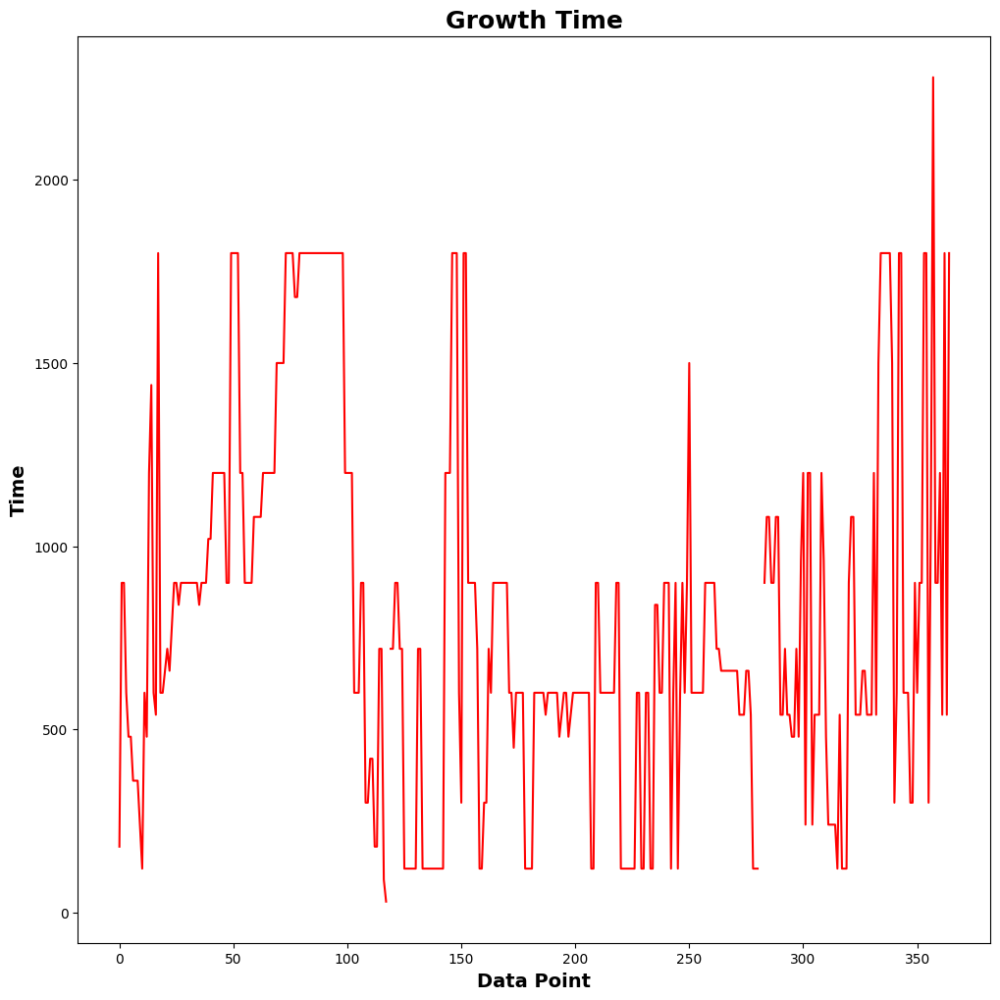

In [ ]:
#plt.scatter(x_vals, y_vals, color = '#003F72')

#plt.plot(x_vals, regression_line, 'r')
plt.rcParams.update({'figure.figsize': (12.0, 12.0)})
plt.plot([i for i in range(365)], [float(item) for item in df_activities_id_time_T_P_sub['time']],'r')
plt.xlabel('Data Point' , fontsize=14, fontweight='bold')
plt.ylabel('Time' , fontsize=14, fontweight='bold')
plt.title("Growth Time", fontsize=18, fontweight='bold')

#plt.savefig("/noether/s0/iam5249/IM_models/IM_coverage_scatter_micro_whole_patch_feature_best.png", dpi=600)
plt.show()

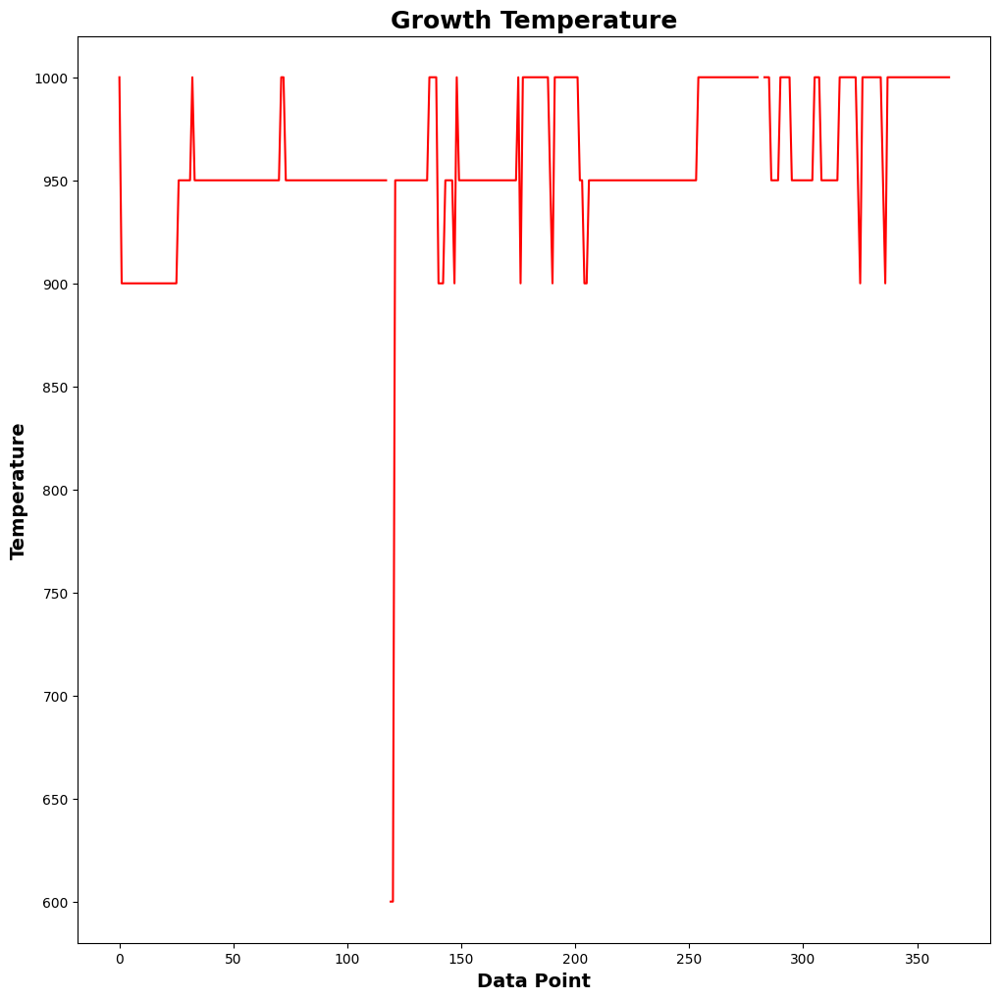

In [ ]:
#plt.scatter(x_vals, y_vals, color = '#003F72')

#plt.plot(x_vals, regression_line, 'r')
plt.rcParams.update({'figure.figsize': (12.0, 12.0)})
plt.plot([i for i in range(365)], [float(item) for item in df_activities_id_time_T_P_sub['T']],'r')
plt.xlabel('Data Point' , fontsize=14, fontweight='bold')
plt.ylabel('Temperature' , fontsize=14, fontweight='bold')
plt.title("Growth Temperature", fontsize=18, fontweight='bold')

#plt.savefig("/noether/s0/iam5249/IM_models/IM_coverage_scatter_micro_whole_patch_feature_best.png", dpi=600)
plt.show()

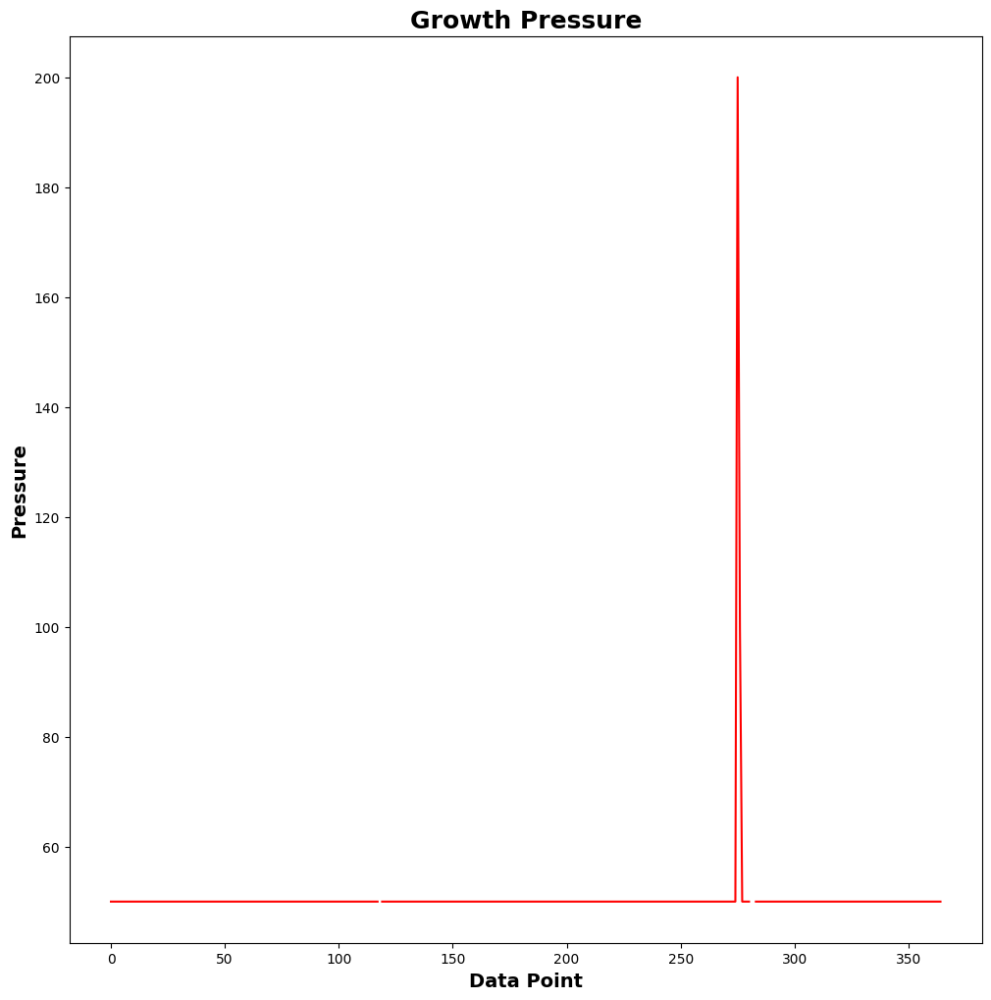

In [ ]:
#plt.scatter(x_vals, y_vals, color = '#003F72')

#plt.plot(x_vals, regression_line, 'r')
plt.rcParams.update({'figure.figsize': (12.0, 12.0)})
plt.plot([i for i in range(365)], [float(item) for item in df_activities_id_time_T_P_sub['P']],'r')
plt.xlabel('Data Point' , fontsize=14, fontweight='bold')
plt.ylabel('Pressure' , fontsize=14, fontweight='bold')
plt.title("Growth Pressure", fontsize=18, fontweight='bold')

#plt.savefig("/noether/s0/iam5249/IM_models/IM_coverage_scatter_micro_whole_patch_feature_best.png", dpi=600)
plt.show()